In [2]:
%matplotlib inline
import numpy as np
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import math

In [8]:
def mostrarImagenes(imagenes, titulos, filas, columnas, figsize=(20, 8), suptitle=''):
    fig, axs = plt.subplots(filas, columnas, figsize=figsize)
    fig.suptitle(suptitle)

    for i in range(filas):
        for j in range(columnas):
            idx = i * columnas + j
            axs[i, j].imshow(imagenes[idx])
            axs[i, j].set_title(titulos[idx])
            axs[i, j].axis('off')

    plt.show()

def histograma(angulos):
    plt.hist(angulos, bins=36, range=(0, 360))
    plt.title('Histograma de Orientaciones')
    plt.xlabel('Ángulo')
    plt.ylabel('Frecuencia')
    plt.show()

def calcularGradientes(imagen):
    gradientes = []
    angulos = []
    xs = []
    ys = []
    divs = []

    arreglo = np.asarray(imagen)

    for i in range(arreglo.shape[0]):
        for j in range(arreglo.shape[1]):
            if(i > 0 and i < arreglo.shape[0]-1 and j > 0 and j < arreglo.shape[1]-1):
                x = arreglo[i, j+1, 0] - arreglo[i, j-1, 0]

                if x != 0:
                    y = arreglo[i-1, j, 0] - arreglo[i+1, j, 0]

                    xs.append(x)
                    ys.append(y)
                    c = y * y + x * x
                    g = pow(c, 0.5)
                    div = y / x
                    divs.append(div)
                    a = math.atan(div)

                    gradientes.append(g)
                    angulos.append(math.degrees(a))

    return angulos

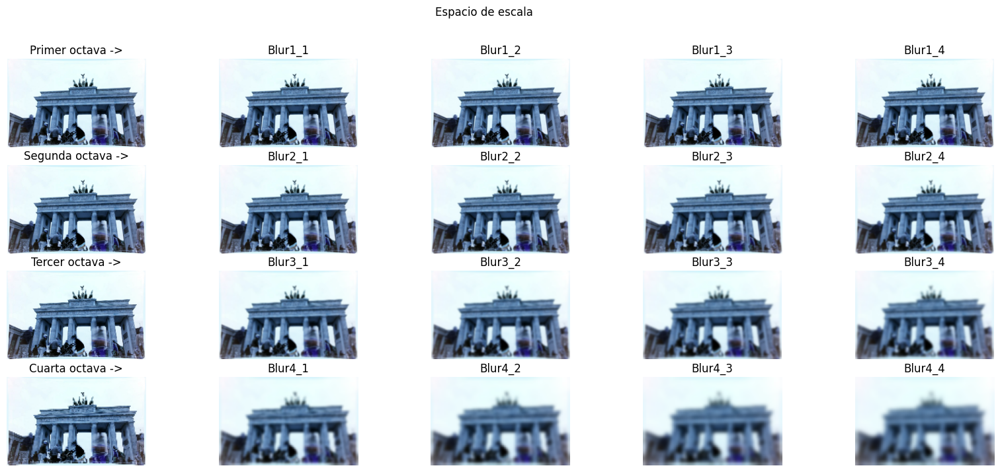

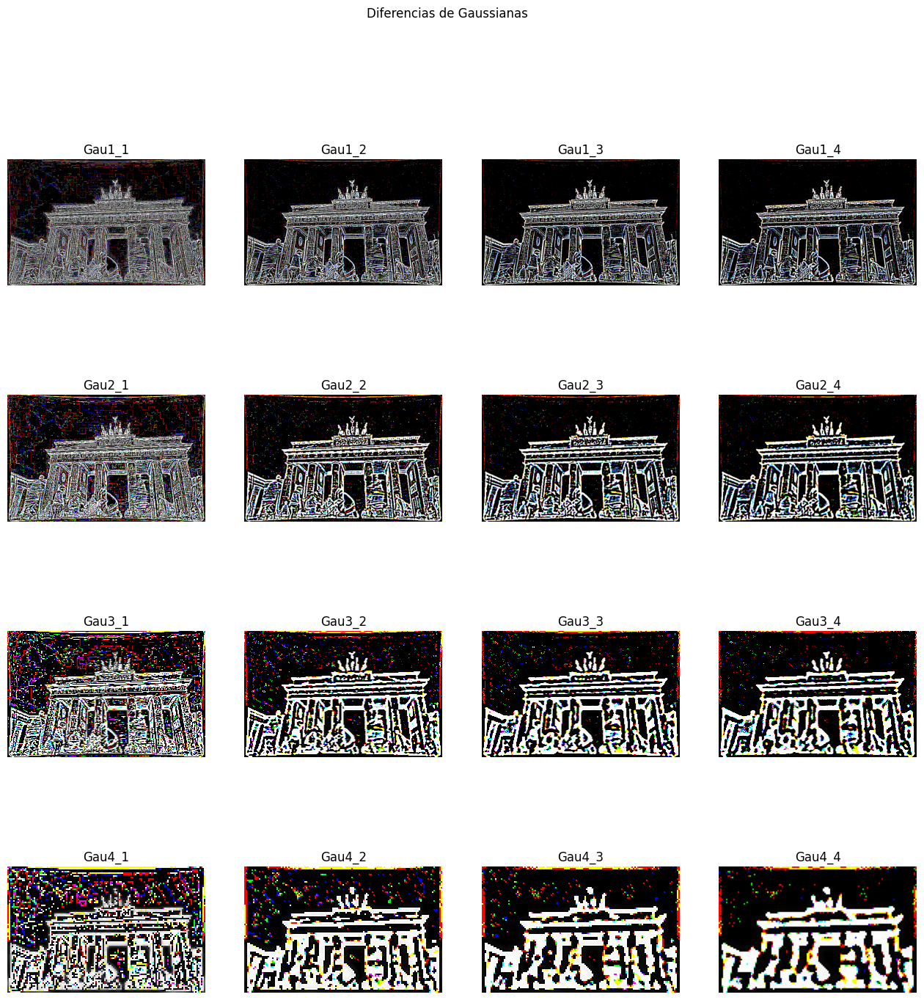

C:\Users\chj06\AppData\Local\Temp\ipykernel_30668\604934943.py:33: RuntimeWarning: overflow encountered in ubyte_scalars
  x = arreglo[i, j+1, 0] - arreglo[i, j-1, 0]
C:\Users\chj06\AppData\Local\Temp\ipykernel_30668\604934943.py:36: RuntimeWarning: overflow encountered in ubyte_scalars
  y = arreglo[i-1, j, 0] - arreglo[i+1, j, 0]
C:\Users\chj06\AppData\Local\Temp\ipykernel_30668\604934943.py:40: RuntimeWarning: overflow encountered in ubyte_scalars
  c = y * y + x * x


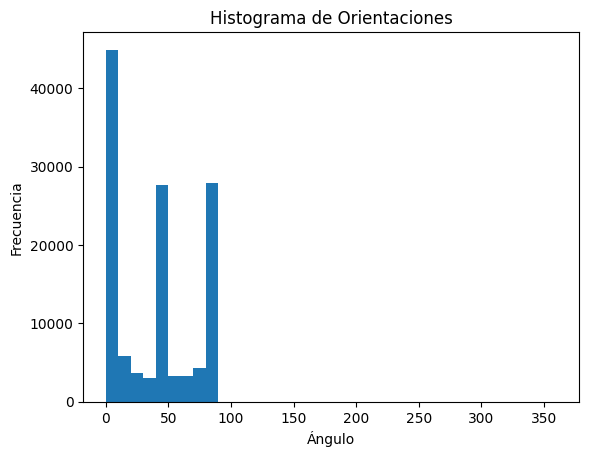

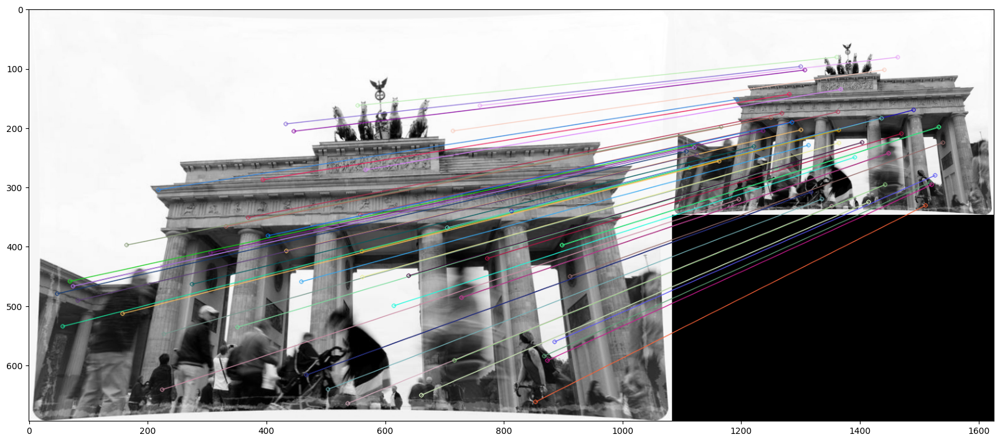

In [9]:
# Cargar imágenes
img1 = cv.imread('img1.jpg')
img2 = cv.imread('img2.jpg')

img2 = cv.resize(img1, (int(img1.shape[1]/2), int(img1.shape[0]/2)))
img3 = cv.resize(img1, (int(img1.shape[1]/4), int(img1.shape[0]/4)))
img4 = cv.resize(img1, (int(img1.shape[1]/8), int(img1.shape[0]/8)))

# Suavizados
blur1_1 = cv.GaussianBlur(img1, (5,5), 0)
blur1_2 = cv.GaussianBlur(blur1_1, (5,5), 0)
blur1_3 = cv.GaussianBlur(blur1_2, (5,5), 0)
blur1_4 = cv.GaussianBlur(blur1_3, (5,5), 0)

blur2_1 = cv.GaussianBlur(img2, (5,5), 0)
blur2_2 = cv.GaussianBlur(blur2_1, (5,5), 0)
blur2_3 = cv.GaussianBlur(blur2_2, (5,5), 0)
blur2_4 = cv.GaussianBlur(blur2_3, (5,5), 0)

blur3_1 = cv.GaussianBlur(img3, (5,5), 0)
blur3_2 = cv.GaussianBlur(blur3_1, (5,5), 0)
blur3_3 = cv.GaussianBlur(blur3_2, (5,5), 0)
blur3_4 = cv.GaussianBlur(blur3_3, (5,5), 0)

blur4_1 = cv.GaussianBlur(img4, (5,5), 0)
blur4_2 = cv.GaussianBlur(blur4_1, (5,5), 0)
blur4_3 = cv.GaussianBlur(blur4_2, (5,5), 0)
blur4_4 = cv.GaussianBlur(blur4_3, (5,5), 0)

# Titulos para las escalas
imagenes_escalas = [img1, blur1_1, blur1_2, blur1_3, blur1_4, img2, blur2_1, blur2_2, blur2_3, blur2_4, img3, blur3_1, blur3_2, blur3_3, blur3_4, img4, blur4_1, blur4_2, blur4_3, blur4_4]
titulos_escalas = ['Primer octava ->', 'Blur1_1', 'Blur1_2', 'Blur1_3', 'Blur1_4', 'Segunda octava ->', 'Blur2_1', 'Blur2_2', 'Blur2_3', 'Blur2_4', 'Tercer octava ->', 'Blur3_1', 'Blur3_2', 'Blur3_3', 'Blur3_4', 'Cuarta octava ->', 'Blur4_1', 'Blur4_2', 'Blur4_3', 'Blur4_4']

# Mostrar escalas
mostrarImagenes(imagenes_escalas, titulos_escalas, 4, 5, suptitle='Espacio de escala')

# Restas de Gaussianas
gau1_1 = img1 - blur1_1
gau1_2 = blur1_1 - blur1_2
gau1_3 = blur1_2 - blur1_3
gau1_4 = blur1_3 - blur1_4

gau2_1 = img2 - blur2_1
gau2_2 = blur2_1 - blur2_2
gau2_3 = blur2_2 - blur2_3
gau2_4 = blur2_3 - blur2_4

gau3_1 = img3 - blur3_1
gau3_2 = blur3_1 - blur3_2
gau3_3 = blur3_2 - blur3_3
gau3_4 = blur3_3 - blur3_4

gau4_1 = img4 - blur4_1
gau4_2 = blur4_1 - blur4_2
gau4_3 = blur4_2 - blur4_3
gau4_4 = blur4_3 - blur4_4

# Nombres de los gaussianos
gau_images = [gau1_1, gau1_2, gau1_3, gau1_4, gau2_1, gau2_2, gau2_3, gau2_4, gau3_1, gau3_2, gau3_3, gau3_4, gau4_1, gau4_2, gau4_3, gau4_4]
gau_titles = ['Gau1_1', 'Gau1_2', 'Gau1_3', 'Gau1_4', 'Gau2_1', 'Gau2_2', 'Gau2_3', 'Gau2_4', 'Gau3_1', 'Gau3_2', 'Gau3_3', 'Gau3_4', 'Gau4_1', 'Gau4_2', 'Gau4_3', 'Gau4_4']

# Mostrar gaussianas
mostrarImagenes(gau_images, gau_titles, 4, 4, figsize=(16, 16), suptitle='Diferencias de Gaussianas')

# Calcular ángulos y mostrar el histograma
angulos = calcularGradientes(img2)
histograma(angulos)

img1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
img2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

sift = cv.xfeatures2d.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2, None)

len(keypoints_1), len(keypoints_2)
bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)
plt.figure(figsize=(20, 20))

img3 = cv.drawMatches(img1, keypoints_1, img2, keypoints_2, matches[:50], img2, flags=2)
plt.imshow(img3)
plt.show()

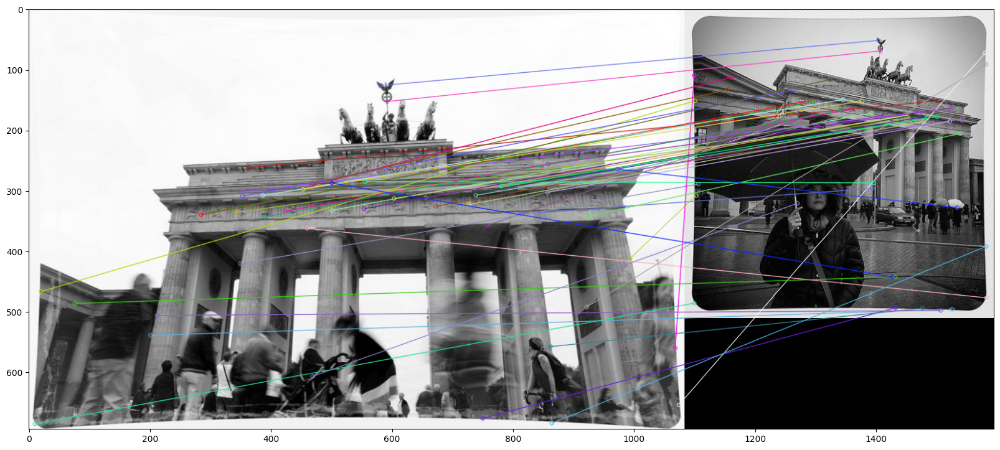

In [4]:
# Cargar imágenes
img1_2 = cv.imread('img1.jpg')
img2_2 = cv.imread('img3.jpg')

img1_2 = cv.cvtColor(img1_2, cv.COLOR_BGR2GRAY)
img2_2 = cv.cvtColor(img2_2, cv.COLOR_BGR2GRAY)

sift = cv.xfeatures2d.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1_2, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2_2, None)

len(keypoints_1), len(keypoints_2)
bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)
plt.figure(figsize=(20, 20))

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv.drawMatches(img1_2, keypoints_1, img2_2, keypoints_2, matches[:50], img2_2, flags=2)
plt.imshow(img3)
plt.show()

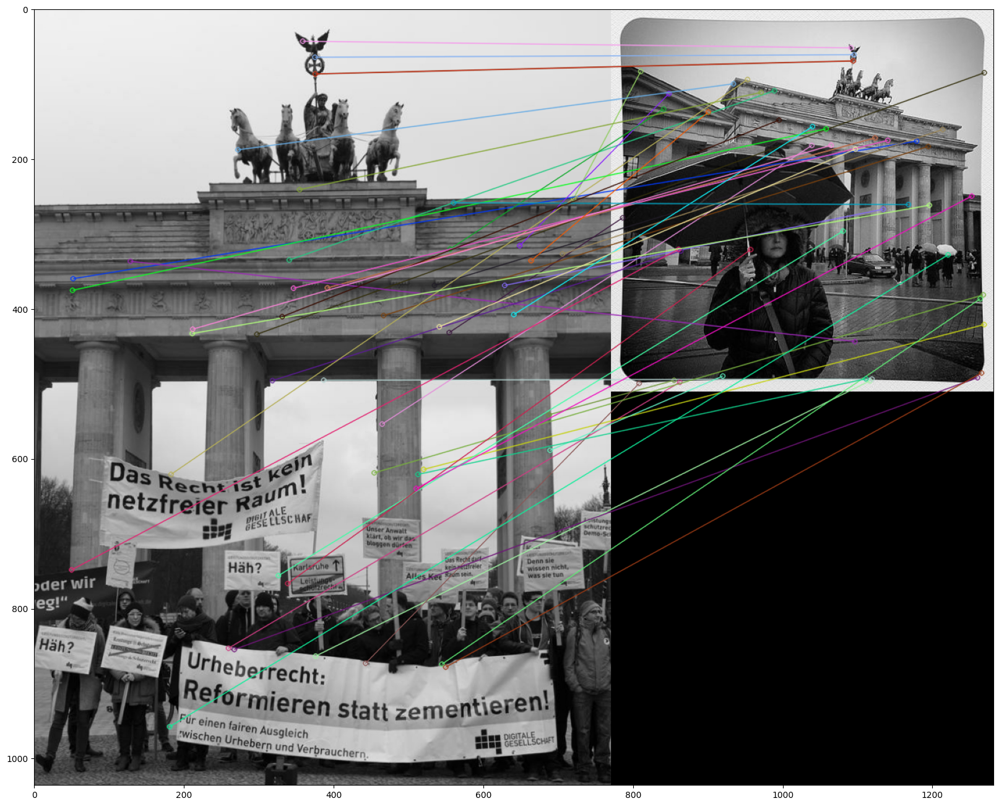

In [5]:
# Cargar imágenes
img1_3 = cv.imread('img2.jpg')
img2_3 = cv.imread('img3.jpg')

img1_3 = cv.cvtColor(img1_3, cv.COLOR_BGR2GRAY)
img2_3 = cv.cvtColor(img2_3, cv.COLOR_BGR2GRAY)

sift = cv.xfeatures2d.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1_3, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2_3, None)

len(keypoints_1), len(keypoints_2)
bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)
plt.figure(figsize=(20, 20))

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv.drawMatches(img1_3, keypoints_1, img2_3, keypoints_2, matches[:50], img2_3, flags=2)
plt.imshow(img3)
plt.show()

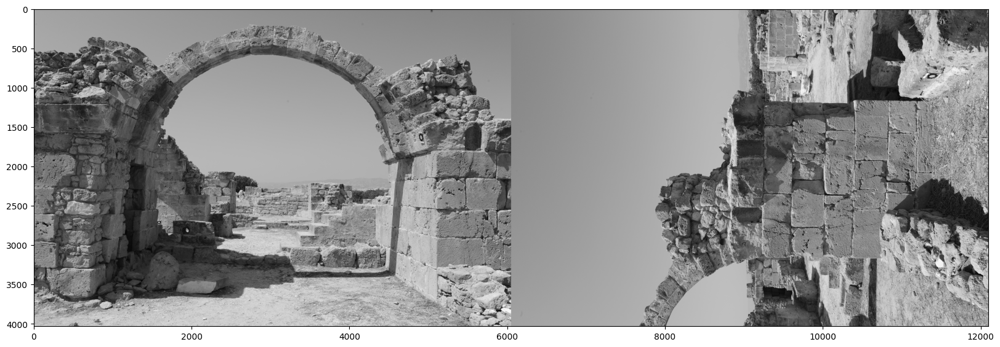

In [4]:
# Cargar imágenes
img1_6 = cv.imread('img4.jpg')
img2_6 = cv.imread('img5.jpg')

img1_6 = cv.cvtColor(img1_6, cv.COLOR_BGR2GRAY)
img2_6 = cv.cvtColor(img2_6, cv.COLOR_BGR2GRAY)

sift = cv.xfeatures2d.SIFT_create(nfeatures=5, contrastThreshold=1)

keypoints_1, descriptors_1 = sift.detectAndCompute(img1_6, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2_6, None)

len(keypoints_1), len(keypoints_2)
bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1, descriptors_2)
matches = sorted(matches, key=lambda x: x.distance)

plt.figure(figsize=(20, 20))

img3 = cv.drawMatches(img1_6, keypoints_1, img2_6, keypoints_2, matches[:5], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
plt.imshow(img3)
plt.show()

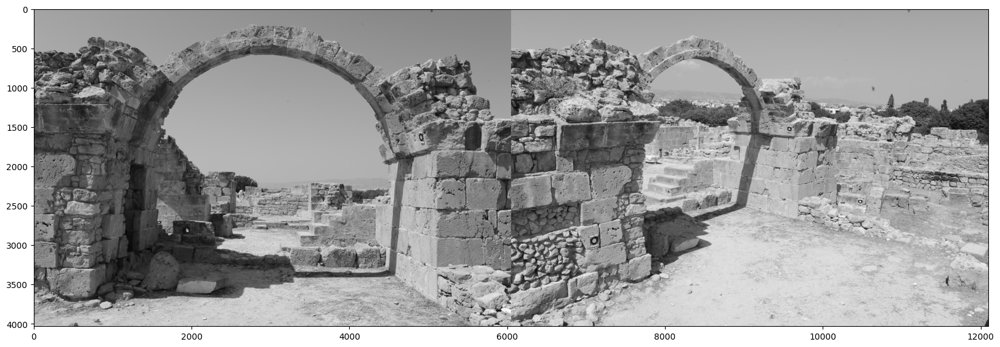

In [5]:
# Cargar imágenes
img1_6 = cv.imread('img4.jpg')
img2_6 = cv.imread('img6.JPG')

img1_6 = cv.cvtColor(img1_6, cv.COLOR_BGR2GRAY)
img2_6 = cv.cvtColor(img2_6, cv.COLOR_BGR2GRAY)

sift = cv.xfeatures2d.SIFT_create(nfeatures=5, contrastThreshold=1)

keypoints_1, descriptors_1 = sift.detectAndCompute(img1_6, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2_6, None)

len(keypoints_1), len(keypoints_2)
bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1, descriptors_2)
matches = sorted(matches, key=lambda x: x.distance)

# Especificar el color oscuro (en formato BGR)
color_oscuro = (0, 0, 0)
plt.figure(figsize=(20, 20))

img3 = cv.drawMatches(img1_6, keypoints_1, img2_6, keypoints_2, matches[:5], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=color_oscuro)
plt.imshow(img3)
plt.show()

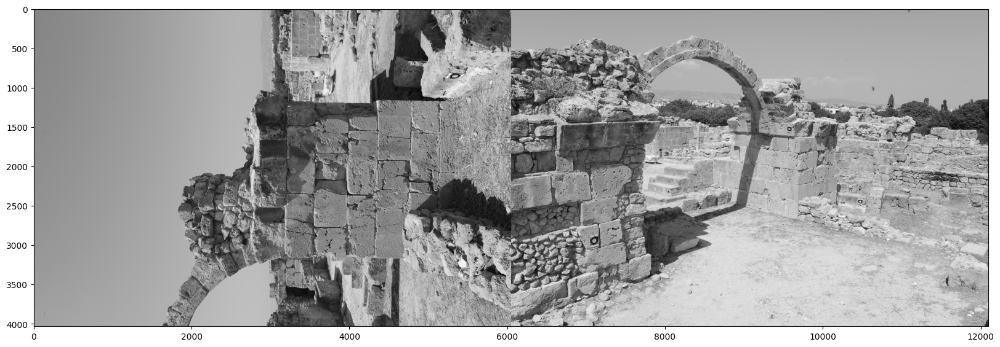

In [10]:
# Cargar imágenes
img1_6 = cv.imread('img5.jpg')
img2_6 = cv.imread('img6.jpg')

img1_6 = cv.cvtColor(img1_6, cv.COLOR_BGR2GRAY)
img2_6 = cv.cvtColor(img2_6, cv.COLOR_BGR2GRAY)

sift = cv.xfeatures2d.SIFT_create(nfeatures=5, contrastThreshold=1)

keypoints_1, descriptors_1 = sift.detectAndCompute(img1_6, None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2_6, None)

len(keypoints_1), len(keypoints_2)
bf = cv.BFMatcher(cv.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1, descriptors_2)
matches = sorted(matches, key=lambda x: x.distance)

# Especificar el color oscuro (en formato BGR)
color_oscuro = (0, 0, 0)
plt.figure(figsize=(20, 20))

img3 = cv.drawMatches(img1_6, keypoints_1, img2_6, keypoints_2, matches[:5], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=color_oscuro)
plt.imshow(img3)
plt.show()